# **Image and Video Technology and Analysis: Lab Exercise 1**
---

* **Peppas Michail-Athanasios**
* **03121026**
* **School of Electrical and Computer Engineering**
* **National Technical University of Athens**
* **Spring 2026**










# **What this Exercise is about**
---

In this exercise, we study the **Laplacian Pyramid** as a multiscale image representation and as a compact image coding method. The main idea of the paper is that a natural image contains a lot of **pixel-to-pixel redundancy**, so instead of coding the image directly, we first construct a **Gaussian pyramid**, that is, a sequence of progressively smoother and lower-resolution versions of the image. Then, from this Gaussian pyramid, we construct the **Laplacian pyramid**, whose levels contain the **difference information** between successive scales. In other words, each Laplacian level stores the image details that are lost when moving to a coarser Gaussian level.

This representation is important because the Laplacian images are more **decorrelated** than the original image, and their values are typically concentrated around zero. As a result, they have **lower entropy** and can be coded more efficiently. The paper also shows that, before quantization, the original image can be reconstructed exactly from the Laplacian pyramid by an **expand-and-sum** procedure. After quantization, the representation becomes lossy, but it can still provide very good visual quality while reducing the amount of information that must be stored or transmitted.

The purpose of this exercise is therefore threefold:

1. **Understand the theory** behind Gaussian and Laplacian pyramids, entropy, and quantization.
2. **Implement the required algorithms** for pyramid construction, reconstruction, and quantization.
3. **Experiment with the method** on test images, in order to study how parameters such as the kernel parameter $a$, the number of pyramid levels, and the quantization bin size affect entropy, compression behavior, and reconstruction quality.

Overall, this exercise connects **image representation**, **image compression**, and **multiscale analysis**. It helps us understand why the Laplacian pyramid is not only a compact coding scheme, but also a useful tool for analyzing image structures at different spatial scales.

# **Part A: The Theory of the Laplacian Pyramid**
---

## **1. How does the value of $a$ affect the Gaussian pyramid?**

The parameter $a$ determines the shape of the **generating kernel** used in the REDUCE operation, and therefore controls how each Gaussian-pyramid level is smoothed before downsampling. In the paper, different values of $a$ produce different equivalent weighting functions: for $a = 0.4$ the filter is close to Gaussian, for $a = 0.5$ it becomes triangular, for $a = 0.3$ it is broader than Gaussian, and for $a = 0.6$ it becomes trimodal. Therefore, changing $a$ changes the amount and the character of the blur from one level to the next. Since the Laplacian pyramid is computed from differences between Gaussian levels, the choice of $a$ also affects the statistics of the Laplacian coefficients, especially their variance and entropy. According to the paper, the strongest entropy reduction in their experiments was obtained around $a \approx 0.6$, while Gaussian levels generated with this value also appeared visually crisper than those obtained with smaller values such as $a = 0.4$.

## **2. What is entropy? What is the maximum entropy of a grayscale image?**

Entropy is a measure of the **average information content** or **uncertainty** of the gray-value distribution of an image. If the probability of gray level $i$ is $f(i)$, then the entropy is defined as

$$
H = - \sum_i f(i)\log_2 f(i).
$$

In image coding, entropy represents the theoretical lower bound on the average number of bits per pixel needed for exact encoding, assuming statistical independence of pixel values. For an 8-bit grayscale image there are $256$ possible intensity values, so the maximum possible entropy is

$$
H_{\max} = -256 \cdot \sum_{i=1}^{256} \frac{1}{256} \log_2\left(\frac{1}{256}\right) = - \log_2\left(\frac{1}{256}\right) = \log_2\left(256\right) = 8 \text{ bits/pixel}
$$


This maximum occurs when all gray levels are equally likely, that is, when the histogram is perfectly uniform. In practice, natural images usually have entropy lower than 8 because their histograms are not uniform and neighboring pixels are strongly correlated. One important result of the Laplacian pyramid is that it reduces this correlation, concentrates values around zero, and therefore often lowers entropy compared to the original image.

## **3. How does the choice of bin size affect the result of quantization?**

In uniform quantization, the range of coefficient values is divided into intervals, or **bins**, of size $n$, and all values inside the same bin are replaced by a representative value, usually the midpoint of that bin. The bin size directly controls the trade-off between **compression** and **distortion**. If the bin size is small, the quantized values remain close to the original ones, so reconstruction quality is better, but more distinct output values must be represented and the entropy remains relatively higher. If the bin size is large, many neighboring values collapse into the same quantized level, which reduces entropy and improves compression, but increases quantization error and visible loss of detail. Therefore, increasing the bin size generally makes coding more efficient but reconstruction less accurate, while decreasing the bin size does the opposite.

## **4. How is quantization affected by the number of pyramid levels?**

The number of pyramid levels affects quantization because each level corresponds to a different **spatial-frequency band** and a different **sample density**. Lower Laplacian levels contain finer, high-frequency details and have many coefficients, while higher levels contain coarser, lower-frequency structures and have far fewer coefficients. According to the paper, higher pyramid levels should generally be quantized more finely, meaning with smaller bin sizes and more quantization levels, because the human visual system is more sensitive to contrast errors at low and medium spatial frequencies. In contrast, lower levels, which represent higher spatial frequencies, can usually be quantized more coarsely without producing equally noticeable visual degradation. However, because the higher levels contain many fewer samples, their contribution to the total bit rate remains relatively small even when finer quantization is used there. Thus, increasing the number of pyramid levels changes how quantization should be distributed across the representation: coarse levels require more careful quantization, while fine-detail levels can tolerate stronger quantization.

## **Part B.1: The Implementation of the Algorithm**
---

## **Function Overview and Implementation Notes**

In this section, we implement the core building blocks of the Laplacian Pyramid algorithm described in the paper *"The Laplacian Pyramid as a Compact Image Code"*. The implementation follows the paper's logic closely, while also handling practical issues such as image dimensions, boundary treatment, reconstruction consistency, and quantization.

---

### 1. `GKernel(a)`

This function constructs the **1D generating kernel** $\hat{w}$ of length 5, parameterized by the scalar $a$.

The kernel is:

$$
\hat{w} = \left[\frac{1}{4} - \frac{a}{2},\ \frac{1}{4},\ a,\ \frac{1}{4},\ \frac{1}{4} - \frac{a}{2}\right]
$$

The corresponding **2D smoothing kernel** is obtained by separability:

$$
w(m,n) = \hat{w}(m)\hat{w}(n)
$$

**What it does:**
- Defines the low-pass filter used by both `GREDUCE` and `GEXPAND`.
- Controls the smoothing behavior of the pyramid through the parameter $a$.

**Key notes:**
- The kernel is symmetric.
- Its coefficients sum to 1, so it preserves average intensity.
- Different values of $a$ lead to different pyramid characteristics and affect entropy and reconstruction behavior.

---

### 2. `_separable_conv2d(I, h)`

This is a helper function that applies **2D convolution using separability**.

Instead of convolving directly with a 2D kernel, we:
1. convolve horizontally with the 1D kernel $h$,
2. then convolve vertically with the same kernel.

**What it does:**
- Performs the smoothing operation required in the pyramid construction.
- Supports both grayscale and color images.

**Key notes:**
- Separable convolution is more efficient than full 2D convolution.
- Reflect padding is used at the boundaries to avoid artificial dark borders or dimension issues.
- The function internally handles grayscale images as a special case of a 3D array and restores the original shape afterward.

---

### 3. `GREDUCE(I, h)`

This function implements the **REDUCE** operation of the Gaussian pyramid.

It first smooths the image and then downsamples it by a factor of 2 in each spatial dimension.

Formally, it corresponds to the paper's idea of:
- low-pass filtering,
- followed by subsampling.

**What it does:**
- Produces the next coarser Gaussian level from the current image.
- Reduces width and height approximately by half.

**Key notes:**
- Filtering before subsampling is essential to reduce aliasing.
- The output contains a lower-resolution, smoother representation of the image.
- If the original dimensions are odd, the reduced dimensions follow Python slicing behavior, so careful shape handling is needed later during expansion.

---

### 4. `GPyramid(I, a, depth)`

This function constructs the **Gaussian pyramid**:

$$
G_0,\ G_1,\ G_2,\ \dots,\ G_{depth-1}
$$

where:
- $G_0$ is the original image,
- each next level is obtained by applying `GREDUCE` to the previous one.

**What it does:**
- Builds the hierarchy of progressively smoother and smaller images.

**Key notes:**
- The parameter `depth` determines how many levels are generated.
- The function checks whether the requested depth is valid for the given image size.
- The Gaussian pyramid is the basis for building the Laplacian pyramid.

---

### 5. `GEXPAND(I, h, out_shape=None)`

This function implements the **EXPAND** operation.

It upsamples an image by:
1. inserting zeros between pixels,
2. filtering the result with $4w$.

This matches the paper's decoding/interpolation mechanism.

**What it does:**
- Reconstructs a finer-resolution approximation from a coarser Gaussian level.
- Is used in both Laplacian pyramid construction and image decoding.

**Key notes:**
- The multiplication by 4 is necessary because zero-insertion changes the sample density.
- `out_shape` is very important when dimensions are odd, because expansion may produce an image that is slightly larger than the target size.
- Cropping to the exact target shape ensures consistency between pyramid levels.

---

### 6. `LPyramid(I, a, depth)`

This function constructs the **Laplacian pyramid** from the Gaussian pyramid.

For each level:

$$
L_l = G_l - \text{EXPAND}(G_{l+1})
$$

for $l = 0, 1, \dots, depth-2$, while the last level is stored as the coarsest Gaussian image.

**What it does:**
- Captures the band-pass or detail information lost between successive Gaussian levels.
- Produces a compact multiscale image representation.

**Key notes:**
- Each Laplacian level stores image details at a specific scale.
- The final level is not a difference image; it is the smallest Gaussian image.
- This pyramid is the encoded representation used later for reconstruction and quantization experiments.

---

### 7. `L_Pyramid_Decode(L, a)`

This function reconstructs the original image from the Laplacian pyramid.

Starting from the coarsest level, reconstruction proceeds upward:

$$
G_l = L_l + \text{EXPAND}(G_{l+1})
$$

until the finest level is recovered.

**What it does:**
- Decodes the Laplacian pyramid back into an approximation of the original image.
- If no quantization has been applied, reconstruction should be nearly exact up to numerical precision.

**Key notes:**
- This is the inverse process of Laplacian pyramid construction.
- It verifies whether the implementation is internally correct.
- Small numerical differences may appear because computations are done in floating-point arithmetic.

---

### 8. `_uniform_quantize_level(level, bin_size)`

This helper function applies **uniform scalar quantization** to one Laplacian level.

It maps continuous coefficient values into discrete multiples of a bin size.

**What it does:**
- Reduces the number of distinct values in a level.
- Makes the representation more compressible.

**Key notes:**
- Larger bin sizes produce stronger compression but also larger distortion.
- Smaller bin sizes preserve more detail but reduce compression gain.
- This is the core mechanism used for the lossy coding experiments in the assignment.

---

### 9. `L_Quantization(L, bin_size)`

This function applies quantization either:
- to a single Laplacian level, or
- to the full Laplacian pyramid.

**What it does:**
- Produces a quantized version of the pyramid for compression experiments.
- Supports either one common bin size for all levels or a separate bin size per level.

**Key notes:**
- This is the function used before reconstruction in the quantization experiments.
- After quantization, the decoded image will generally no longer match the original exactly.
- The effect of quantization is analyzed later in terms of visual quality and entropy.

---

### 10. `clip_to_uint8(I)`

This helper function converts an image back to displayable 8-bit form.

**What it does:**
- Rounds values,
- clips them to the valid range $[0, 255]$,
- converts the result to `uint8`.

**Key notes:**
- This is mainly used for visualization and display.
- Internal computations should remain in floating-point form for accuracy.

---

### 11. `reconstruction_error(original, reconstructed)`

This helper function measures the difference between the original image and the reconstructed image.

It returns:
- the **maximum absolute error**,
- the **mean squared error (MSE)**.

**What it does:**
- Provides a direct numerical check of reconstruction quality.
- Helps verify correctness before moving to quantization.

**Key notes:**
- For an unquantized Laplacian pyramid, the reconstruction error should be extremely small.
- After quantization, the error will increase, and this increase reflects the compression-distortion tradeoff.

---

## General Implementation Notes

**Data type handling**
- All pyramid computations are performed in `float64`.
- This avoids rounding problems during filtering, subtraction, and reconstruction.

**Boundary handling**
- Convolution uses **reflect padding**.
- This gives smoother and more realistic border behavior than zero padding.

**Dimension consistency**
- Pyramid levels may involve odd dimensions.
- For this reason, `GEXPAND` includes explicit shape control through `out_shape`.

**Why these helper functions matter**
- The notebook experiments depend on correct and stable low-level operations.
- If REDUCE, EXPAND, or shape handling is not implemented carefully, reconstruction errors and size mismatches appear quickly.

---

## Summary

The implemented functions together form the complete pipeline of the Laplacian Pyramid method:

$$
\text{Image} \rightarrow \text{Gaussian Pyramid} \rightarrow \text{Laplacian Pyramid} \rightarrow \text{Quantization} \rightarrow \text{Decoding}
$$

This gives us all the tools needed for the next part of the notebook, where we will:
- build pyramids for real images,
- reconstruct images,
- compute entropy,
- compare different values of $a$,
- test different pyramid depths,
- and study the effect of quantization.

In [ ]:
import numpy as np


# ============================================================
# Part B.1 - Implementation of the Algorithm
# ============================================================

def GKernel(a):
    r"""
    Create the 1D generating kernel \hat{w} of length 5 from the paper.

    The 2D kernel is separable:
        w(m, n) = \hat{w}(m) * \hat{w}(n)

    Paper constraints give:
        w_hat(0)   = a
        w_hat(±1)  = 1/4
        w_hat(±2)  = 1/4 - a/2
    """
    return np.array(
        [0.25 - a / 2.0, 0.25, a, 0.25, 0.25 - a / 2.0],
        dtype=np.float64
    )


def _as_float_image(I):
    """
    Convert image to float64 and validate dimensions.
    Supports:
      - grayscale: H x W
      - color:     H x W x C
    """
    I = np.asarray(I, dtype=np.float64)

    if I.ndim not in (2, 3):
        raise ValueError("Input image must be either 2D (grayscale) or 3D (color).")

    return I


def _max_pyramid_depth(shape):
    """
    Maximum valid number of levels, counting the original image as level 1.
    """
    H, W = shape[:2]
    depth = 1

    while H > 1 and W > 1:
        H = (H + 1) // 2
        W = (W + 1) // 2
        depth += 1

    return depth


def _separable_conv2d(I, h):
    """
    Apply separable 2D convolution with 1D kernel h in x and y directions.
    Reflect padding is used for stable boundary handling.
    """
    I = _as_float_image(I)

    squeeze_output = False
    if I.ndim == 2:
        I = I[..., None]
        squeeze_output = True

    H, W, C = I.shape
    pad = len(h) // 2

    # Horizontal filtering
    padded = np.pad(I, ((0, 0), (pad, pad), (0, 0)), mode="reflect")
    tmp = np.zeros((H, W, C), dtype=np.float64)

    for k in range(len(h)):
        tmp += h[k] * padded[:, k:k + W, :]

    # Vertical filtering
    padded = np.pad(tmp, ((pad, pad), (0, 0), (0, 0)), mode="reflect")
    out = np.zeros((H, W, C), dtype=np.float64)

    for k in range(len(h)):
        out += h[k] * padded[k:k + H, :, :]

    if squeeze_output:
        return out[..., 0]

    return out


def GREDUCE(I, h):
    """
    REDUCE operation according to equation (1):
    low-pass filtering followed by subsampling by 2 in each dimension.
    """
    I_blur = _separable_conv2d(I, h)

    if I_blur.ndim == 2:
        return I_blur[::2, ::2]

    return I_blur[::2, ::2, :]


def GEXPAND(I, h, out_shape=None):
    """
    EXPAND operation according to equation (2):
    upsample by inserting zeros, then filter with 4*w.

    Parameters
    ----------
    I : input image
    h : 1D generating kernel
    out_shape : optional target shape used to crop the result so it matches
                the intended Gaussian/Laplacian parent level exactly.
                This is especially important for odd image dimensions.
    """
    I = _as_float_image(I)

    squeeze_output = False
    if I.ndim == 2:
        I = I[..., None]
        squeeze_output = True

    H, W, C = I.shape

    expanded = np.zeros((2 * H, 2 * W, C), dtype=np.float64)
    expanded[::2, ::2, :] = I

    out = 4.0 * _separable_conv2d(expanded, h)

    if out_shape is not None:
        target_H, target_W = out_shape[:2]
        out = out[:target_H, :target_W, :]

    if squeeze_output:
        return out[..., 0]

    return out


def GPyramid(I, a, depth):
    """
    Build the Gaussian pyramid:
        G = [g0, g1, ..., g_(depth-1)]

    where g0 is the original image.
    """
    I = _as_float_image(I)

    if depth < 1:
        raise ValueError("depth must be at least 1.")

    max_depth = _max_pyramid_depth(I.shape)
    if depth > max_depth:
        raise ValueError(
            f"Requested depth={depth}, but maximum valid depth for this image is {max_depth}."
        )

    h = GKernel(a)
    G = [I.copy()]

    for _ in range(1, depth):
        G.append(GREDUCE(G[-1], h))

    return G


def LPyramid(I, a, depth):
    """
    Build the Laplacian pyramid:
        L_l = g_l - EXPAND(g_(l+1))   for l = 0, ..., depth-2
        L_(depth-1) = g_(depth-1)

    Returns
    -------
    L : list of Laplacian levels, where the last level is the coarsest Gaussian.
    """
    G = GPyramid(I, a, depth)
    h = GKernel(a)

    L = []
    for l in range(len(G) - 1):
        g_expand = GEXPAND(G[l + 1], h, out_shape=G[l].shape)
        L.append(G[l] - g_expand)

    L.append(G[-1].copy())

    return L


def L_Pyramid_Decode(L, a):
    """
    Decode / reconstruct the image from the Laplacian pyramid.

    Starting from the top:
        g_N = L_N
        g_l = L_l + EXPAND(g_(l+1))
    """
    if len(L) == 0:
        raise ValueError("Laplacian pyramid is empty.")

    h = GKernel(a)
    current = np.asarray(L[-1], dtype=np.float64)

    for l in range(len(L) - 2, -1, -1):
        current = GEXPAND(current, h, out_shape=np.asarray(L[l]).shape) + np.asarray(L[l], dtype=np.float64)

    return current


def _uniform_quantize_level(level, bin_size):
    """
    Uniform quantization according to equation (5):
        C_l(i, j) = m*n  if  (m - 1/2)n < L_l(i, j) <= (m + 1/2)n

    This is implemented with the equivalent closed-form rule:
        C = n * ceil(L / n - 1/2)
    """
    if bin_size <= 0:
        raise ValueError("bin_size must be positive.")

    level = np.asarray(level, dtype=np.float64)
    return bin_size * np.ceil(level / bin_size - 0.5)


def L_Quantization(L, bin_size):
    """
    Quantize a Laplacian pyramid or a single Laplacian level.

    Parameters
    ----------
    L : list of pyramid levels OR a single array
    bin_size : scalar or list-like
        - scalar: same bin size for all levels
        - list/tuple: one bin size per level
    """
    if isinstance(L, (list, tuple)):
        if np.isscalar(bin_size):
            bin_sizes = [float(bin_size)] * len(L)
        else:
            bin_sizes = list(bin_size)
            if len(bin_sizes) != len(L):
                raise ValueError("If bin_size is a list/tuple, it must match the number of pyramid levels.")

        return [_uniform_quantize_level(level, b) for level, b in zip(L, bin_sizes)]

    return _uniform_quantize_level(L, float(bin_size))


# ------------------------------------------------------------
# Small utility helpers for later experiments
# ------------------------------------------------------------

def clip_to_uint8(I):
    """
    Clip and convert image to uint8 for display.
    """
    return np.clip(np.rint(I), 0, 255).astype(np.uint8)


def reconstruction_error(original, reconstructed):
    """
    Maximum absolute reconstruction error and mean squared error.
    Useful to verify lossless reconstruction before quantization.
    """
    original = np.asarray(original, dtype=np.float64)
    reconstructed = np.asarray(reconstructed, dtype=np.float64)

    abs_err = np.max(np.abs(original - reconstructed))
    mse = np.mean((original - reconstructed) ** 2)

    return abs_err, mse


## **Part B.2: Experimenting with the Algorithm**
---

### **Results and Comments - Question 1**

In this first experiment, the functions `LPyramid()` and `L_Pyramid_Decode()` were tested on two different image types:

- **Lena (RGB)**, as a color image
- **camera**, as a grayscale image

For both images, the pyramid was constructed with:

$$
a = 0.4, \qquad \text{depth} = 5
$$

---

#### 1. Pyramid structure

The produced Laplacian pyramid contains 5 levels in each case, with dimensions decreasing by a factor of 2 from one level to the next:

$$
512 \times 512 \rightarrow 256 \times 256 \rightarrow 128 \times 128 \rightarrow 64 \times 64 \rightarrow 32 \times 32
$$

This confirms that the REDUCE operation works correctly and that the pyramid is built consistently for both grayscale and RGB images.

---

#### 2. Reconstruction quality

After decoding the Laplacian pyramid, the reconstructed images are visually indistinguishable from the originals.  
This is also confirmed numerically:

**Lena (RGB):**
- Max absolute error: $0.000000000000$
- MSE: $3.673209824662 \times 10^{-32}$

**camera (grayscale):**
- Max absolute error: $0.000000000000$
- MSE: $1.104829272824 \times 10^{-31}$

These values are essentially zero and show that the reconstruction is exact up to floating-point numerical precision.

---

#### 3. Error visualization

The absolute error images are almost completely dark. The tiny visible responses correspond only to numerical floating-point noise at extremely small magnitude (around $10^{-14}$), not to meaningful reconstruction distortion.

---

#### 4. Conclusion

The results verify that the implementation of the Laplacian Pyramid is correct:

- the pyramid is constructed with the expected multiscale structure,
- decoding successfully reconstructs the original image,
- the implementation works properly for both **color** and **grayscale** inputs,
- and the numerical error is negligible.

Therefore, the core functions are validated and can now be used safely for the experimental study of the parameters $a$, depth, entropy, and quantization in the next questions.

Testing image: Lena (RGB)
Input shape: (512, 512, 3)
Using a = 0.4, depth = 5
Number of pyramid levels: 5
Level shapes:
  L[0] shape = (512, 512, 3)
  L[1] shape = (256, 256, 3)
  L[2] shape = (128, 128, 3)
  L[3] shape = (64, 64, 3)
  L[4] shape = (32, 32, 3)
Max absolute reconstruction error: 0.000000000000
Mean squared error (MSE):          3.673209824662e-32


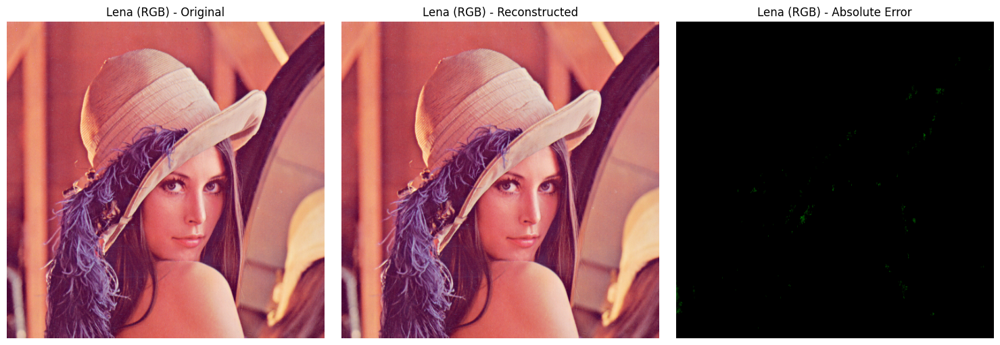

Testing image: camera (grayscale)
Input shape: (512, 512)
Using a = 0.4, depth = 5
Number of pyramid levels: 5
Level shapes:
  L[0] shape = (512, 512)
  L[1] shape = (256, 256)
  L[2] shape = (128, 128)
  L[3] shape = (64, 64)
  L[4] shape = (32, 32)
Max absolute reconstruction error: 0.000000000000
Mean squared error (MSE):          1.104829272824e-31


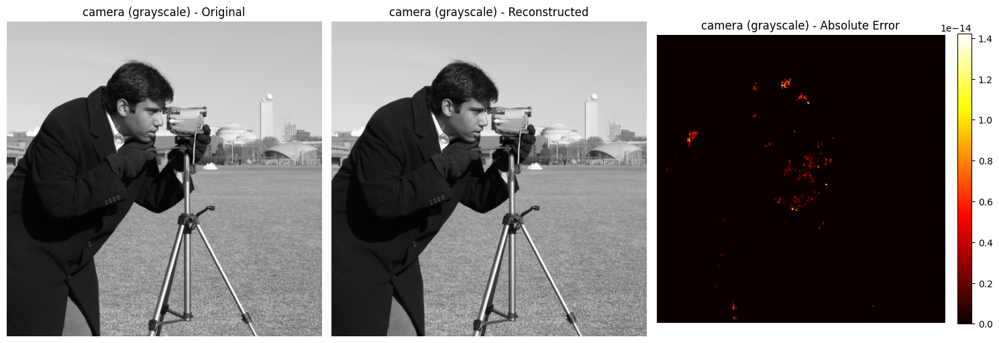

In [ ]:
# ============================================================
# Part B.2 - Question 1
# Check LPyramid and L_Pyramid_Decode on Lena (color)
# and camera (grayscale)
# ============================================================

import os
import urllib.request
from io import BytesIO

import matplotlib.pyplot as plt
from PIL import Image
from skimage import data


def load_lena_rgb():
    """
    Load Lena as an RGB image.
    Priority:
    1. Local file, if already uploaded
    2. Direct download from known URLs
    """
    local_candidates = [
        "/content/lena.png",
        "/content/Lenna.png",
        "/content/lena.jpg",
        "/content/Lenna.jpg"
    ]

    for path in local_candidates:
        if os.path.exists(path):
            return np.array(Image.open(path).convert("RGB"), dtype=np.float64)

    url_candidates = [
        "http://www.image.ntua.gr/~tpar/LABimage/lena.png",
        "https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png"
    ]

    last_error = None
    for url in url_candidates:
        try:
            with urllib.request.urlopen(url, timeout=20) as response:
                img = Image.open(BytesIO(response.read())).convert("RGB")
                return np.array(img, dtype=np.float64)
        except Exception as e:
            last_error = e

    raise RuntimeError(
        "Could not load Lena automatically. "
        "Upload lena.png to Colab manually and place it in /content/."
    ) from last_error


def show_reconstruction_results(original, reconstructed, title_prefix, cmap=None):
    """
    Display original, reconstructed, and absolute error images.
    """
    abs_err = np.abs(original - reconstructed)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    if original.ndim == 2:
        axes[0].imshow(clip_to_uint8(original), cmap=cmap)
        axes[1].imshow(clip_to_uint8(reconstructed), cmap=cmap)

        vmax = abs_err.max() if abs_err.max() > 0 else 1.0
        im = axes[2].imshow(abs_err, cmap="hot", vmin=0, vmax=vmax)
        fig.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)
    else:
        axes[0].imshow(clip_to_uint8(original))
        axes[1].imshow(clip_to_uint8(reconstructed))

        if abs_err.max() > 0:
            err_vis = abs_err / abs_err.max()
        else:
            err_vis = abs_err
        axes[2].imshow(err_vis)

    axes[0].set_title(f"{title_prefix} - Original")
    axes[1].set_title(f"{title_prefix} - Reconstructed")
    axes[2].set_title(f"{title_prefix} - Absolute Error")

    for ax in axes:
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ------------------------------------------------------------
# Fixed parameters for validation
# We use one reasonable setup here just to verify correctness.
# Parameter sweeps over a and depth will be done in Questions 2 and 3.
# ------------------------------------------------------------
a_test = 0.4
depth_test = 5

# Load the two required images
lena_rgb = load_lena_rgb()                  # color image
camera_gray = data.camera().astype(np.float64)  # grayscale image

images = {
    "Lena (RGB)": lena_rgb,
    "camera (grayscale)": camera_gray
}

for name, img in images.items():
    print("=" * 80)
    print(f"Testing image: {name}")
    print(f"Input shape: {img.shape}")
    print(f"Using a = {a_test}, depth = {depth_test}")

    L = LPyramid(img, a=a_test, depth=depth_test)
    reconstructed = L_Pyramid_Decode(L, a=a_test)

    max_abs_err, mse = reconstruction_error(img, reconstructed)

    print(f"Number of pyramid levels: {len(L)}")
    print("Level shapes:")
    for idx, level in enumerate(L):
        print(f"  L[{idx}] shape = {level.shape}")

    print(f"Max absolute reconstruction error: {max_abs_err:.12f}")
    print(f"Mean squared error (MSE):          {mse:.12e}")

    if img.ndim == 2:
        show_reconstruction_results(img, reconstructed, name, cmap="gray")
    else:
        show_reconstruction_results(img, reconstructed, name)

### **Results and Comments - Question 2**

In this experiment, the parameter $a$ of the generating kernel was varied in the interval:

$$
a \in \{0.3,\ 0.4,\ 0.5,\ 0.6,\ 0.7\}
$$

while the pyramid depth was kept fixed at:

$$
\text{depth} = 5
$$

The goal was to study whether changing $a$ affects the decoded image and the reconstruction accuracy.

---

#### 1. Visual comparison

For both test images, **Lena (RGB)** and **camera (grayscale)**, the decoded images are visually indistinguishable from the original image for all tested values of $a$.

This means that changing $a$ does **not** introduce visible reconstruction errors, as long as:
- the same value of $a$ is used consistently in both encoding and decoding,
- and no quantization is applied.

---

#### 2. Numerical reconstruction error

The reconstruction errors are extremely small for all tested values of $a$.

**Lena (RGB), depth = 5**
- $a = 0.3$: max error $= 2.84 \times 10^{-14}$, MSE $= 4.35 \times 10^{-32}$
- $a = 0.4$: max error $= 2.84 \times 10^{-14}$, MSE $= 3.67 \times 10^{-32}$
- $a = 0.5$: max error $= 0$, MSE $= 0$
- $a = 0.6$: max error $= 1.14 \times 10^{-13}$, MSE $= 5.30 \times 10^{-31}$
- $a = 0.7$: max error $= 1.71 \times 10^{-13}$, MSE $= 7.01 \times 10^{-30}$

**camera (grayscale), depth = 5**
- $a = 0.3$: max error $= 2.84 \times 10^{-14}$, MSE $= 9.63 \times 10^{-32}$
- $a = 0.4$: max error $= 1.42 \times 10^{-14}$, MSE $= 1.10 \times 10^{-31}$
- $a = 0.5$: max error $= 0$, MSE $= 0$
- $a = 0.6$: max error $= 5.68 \times 10^{-14}$, MSE $= 1.31 \times 10^{-30}$
- $a = 0.7$: max error $= 2.84 \times 10^{-13}$, MSE $= 1.56 \times 10^{-29}$

All these values are essentially zero and correspond only to floating-point numerical precision.

---

#### 3. Interpretation

The parameter $a$ changes the shape of the smoothing kernel, so it changes the internal distribution of information across the pyramid levels. However, when the pyramid is decoded with the same kernel parameter, reconstruction remains effectively exact.

Therefore, in the **unquantized** case, varying $a$ mainly affects:
- the filtering characteristics of the pyramid,
- and later, the entropy and compression behavior,

but **not** the ability to reconstruct the image accurately.

---

#### 4. Conclusion

The experiment shows that for all tested values of $a$, the Laplacian Pyramid remains perfectly decodable in practice. The decoded images match the originals both visually and numerically.

So, the main importance of $a$ is **not reconstruction fidelity before quantization**, but rather its effect on:
- the statistical properties of the Laplacian levels,
- the entropy of the representation,
- and eventually the efficiency of image coding.

This will be examined more meaningfully in the next entropy-related experiments.

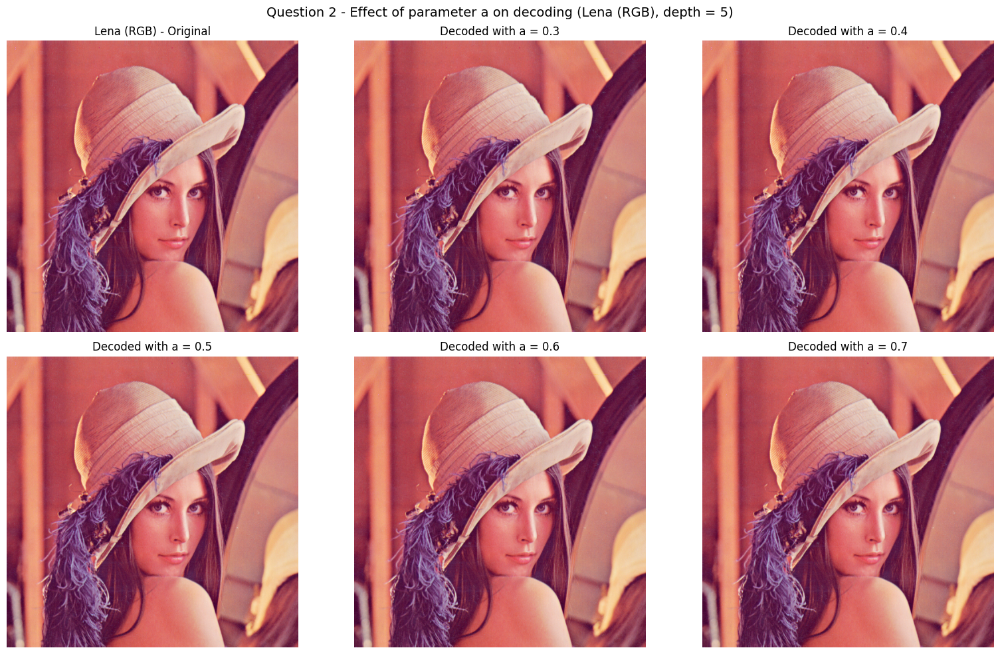


Reconstruction errors for Lena (RGB) (depth = 5)


,a,max_abs_error,mse
0,0.3,2.842171e-14,4.349291e-32
1,0.4,2.842171e-14,3.673210e-32
2,0.5,0.000000e+00,0.000000e+00
3,0.6,1.136868e-13,5.303372e-31
4,0.7,1.705303e-13,7.013017e-30


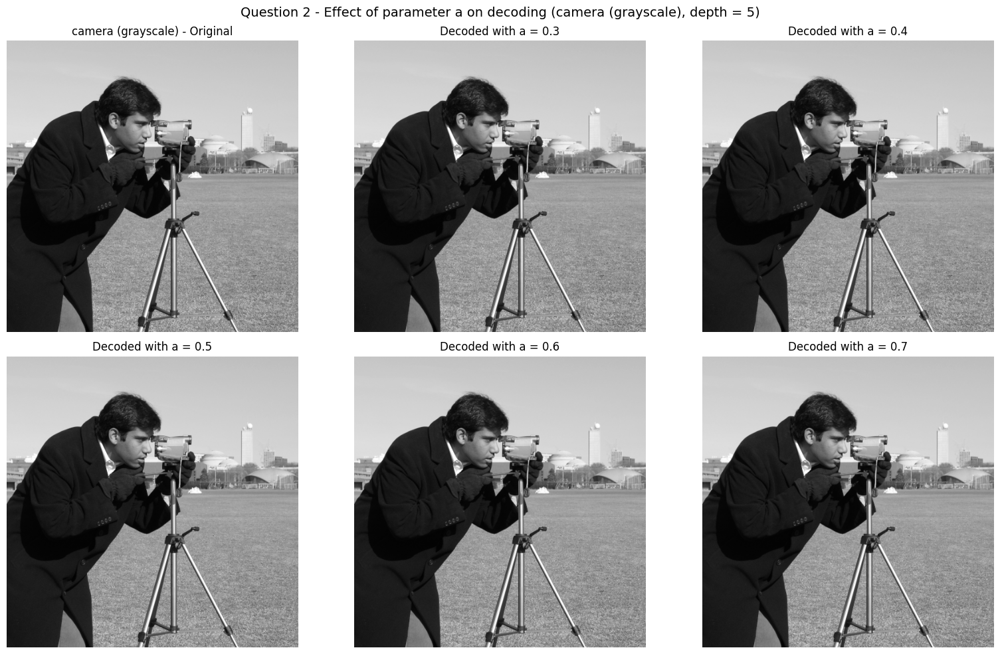


Reconstruction errors for camera (grayscale) (depth = 5)


,a,max_abs_error,mse
0,0.3,2.842171e-14,9.630703e-32
1,0.4,1.421085e-14,1.104829e-31
2,0.5,0.000000e+00,0.000000e+00
3,0.6,5.684342e-14,1.305779e-30
4,0.7,2.842171e-13,1.560540e-29


In [ ]:
# ============================================================
# Part B.2 - Question 2
# Display the original and decoded images for different values
# of a in the interval [0.3, ..., 0.7]
# ============================================================

import pandas as pd
import matplotlib.pyplot as plt
from skimage import data


# ------------------------------------------------------------
# Ensure the test images exist
# ------------------------------------------------------------
try:
    lena_rgb
except NameError:
    lena_rgb = load_lena_rgb()

try:
    camera_gray
except NameError:
    camera_gray = data.camera().astype(np.float64)


# ------------------------------------------------------------
# Fixed depth for this experiment
# We vary only 'a' here.
# ------------------------------------------------------------
depth_fixed = 5
a_values = [0.3, 0.4, 0.5, 0.6, 0.7]


def run_a_experiment(image, image_name, depth, a_values, cmap=None):
    """
    For a fixed depth, reconstruct the image for several values of a,
    display the results, and report reconstruction errors.
    """
    reconstructions = []
    rows = []

    for a in a_values:
        L = LPyramid(image, a=a, depth=depth)
        reconstructed = L_Pyramid_Decode(L, a=a)

        max_abs_err, mse = reconstruction_error(image, reconstructed)

        reconstructions.append((a, reconstructed))
        rows.append({
            "a": a,
            "max_abs_error": max_abs_err,
            "mse": mse
        })

    # --------------------------------------------------------
    # Visualization
    # Layout: 2 rows x 3 columns
    # [Original, a=0.3, a=0.4]
    # [a=0.5,   a=0.6, a=0.7]
    # --------------------------------------------------------
    fig, axes = plt.subplots(2, 3, figsize=(16, 10))
    axes = axes.ravel()

    if image.ndim == 2:
        axes[0].imshow(clip_to_uint8(image), cmap=cmap)
    else:
        axes[0].imshow(clip_to_uint8(image))
    axes[0].set_title(f"{image_name} - Original")
    axes[0].axis("off")

    for idx, (a, reconstructed) in enumerate(reconstructions, start=1):
        if reconstructed.ndim == 2:
            axes[idx].imshow(clip_to_uint8(reconstructed), cmap=cmap)
        else:
            axes[idx].imshow(clip_to_uint8(reconstructed))

        axes[idx].set_title(f"Decoded with a = {a}")
        axes[idx].axis("off")

    plt.suptitle(
        f"Question 2 - Effect of parameter a on decoding ({image_name}, depth = {depth})",
        fontsize=14
    )
    plt.tight_layout()
    plt.show()

    # --------------------------------------------------------
    # Error table
    # --------------------------------------------------------
    df = pd.DataFrame(rows)
    print(f"\nReconstruction errors for {image_name} (depth = {depth})")
    display(df)


# ------------------------------------------------------------
# Run the experiment for both required images
# ------------------------------------------------------------
run_a_experiment(
    image=lena_rgb,
    image_name="Lena (RGB)",
    depth=depth_fixed,
    a_values=a_values
)

run_a_experiment(
    image=camera_gray,
    image_name="camera (grayscale)",
    depth=depth_fixed,
    a_values=a_values,
    cmap="gray"
)

### **Results and Comments - Question 3**

In this experiment, the pyramid depth was varied in the interval:

$$
\text{depth} \in \{3,\ 4,\ 5,\ 6\}
$$

while the kernel parameter was kept fixed at:

$$
a = 0.4
$$

The goal was to examine whether increasing the number of pyramid levels affects the decoded image and the reconstruction accuracy.

---

#### 1. Visual comparison

For both test images, **Lena (RGB)** and **camera (grayscale)**, the decoded images are visually indistinguishable from the originals for all tested depth values.

Thus, changing the number of pyramid levels does **not** introduce visible reconstruction distortion, provided that:
- the pyramid is decoded correctly,
- the same parameter $a$ is used throughout,
- and no quantization is applied.

---

#### 2. Numerical reconstruction error

The reconstruction errors remain extremely small for all tested depths.

**Lena (RGB), $a = 0.4$**
- depth $= 3$: max error $= 1.42 \times 10^{-14}$, MSE $= 1.13 \times 10^{-32}$
- depth $= 4$: max error $= 2.84 \times 10^{-14}$, MSE $= 2.47 \times 10^{-32}$
- depth $= 5$: max error $= 2.84 \times 10^{-14}$, MSE $= 3.67 \times 10^{-32}$
- depth $= 6$: max error $= 2.84 \times 10^{-14}$, MSE $= 6.57 \times 10^{-32}$

**camera (grayscale), $a = 0.4$**
- depth $= 3$: max error $= 1.42 \times 10^{-14}$, MSE $= 1.98 \times 10^{-32}$
- depth $= 4$: max error $= 1.42 \times 10^{-14}$, MSE $= 5.43 \times 10^{-32}$
- depth $= 5$: max error $= 1.42 \times 10^{-14}$, MSE $= 1.10 \times 10^{-31}$
- depth $= 6$: max error $= 1.42 \times 10^{-14}$, MSE $= 1.42 \times 10^{-31}$

Again, all these values are essentially zero and reflect only floating-point numerical precision.

---

#### 3. Interpretation

Increasing the pyramid depth changes how image information is distributed across scales:
- with **smaller depth**, more information remains in the finer levels,
- with **larger depth**, the image is decomposed into more progressively coarser levels.

However, in the **unquantized** case, this does not harm reconstruction. The Laplacian Pyramid still retains all the information required to recover the original image.

A slight increase in MSE for larger depths is visible numerically, but the values remain at an extremely small scale and have no practical visual effect.

---

#### 4. Conclusion

The experiment shows that the Laplacian Pyramid can be decoded accurately for all tested depth values. The reconstructed images remain visually identical to the originals, and the numerical errors stay negligible.

Therefore, just like the parameter $a$, the pyramid depth does **not** affect reconstruction fidelity before quantization. Its real importance lies in how the image representation is organized across scales and how this later influences:
- entropy,
- compression efficiency,
- and quantization performance.

This will become more important in the following experiments.

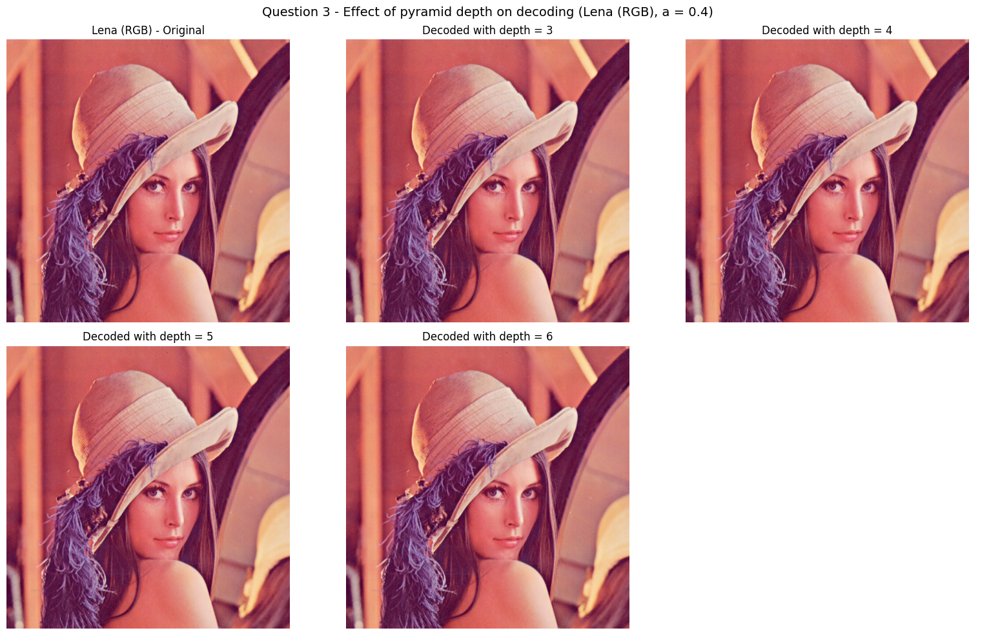


Reconstruction errors for Lena (RGB) (a = 0.4)


,depth,max_abs_error,mse
0,3,1.421085e-14,1.128475e-32
1,4,2.842171e-14,2.465993e-32
2,5,2.842171e-14,3.673210e-32
3,6,2.842171e-14,6.572537e-32


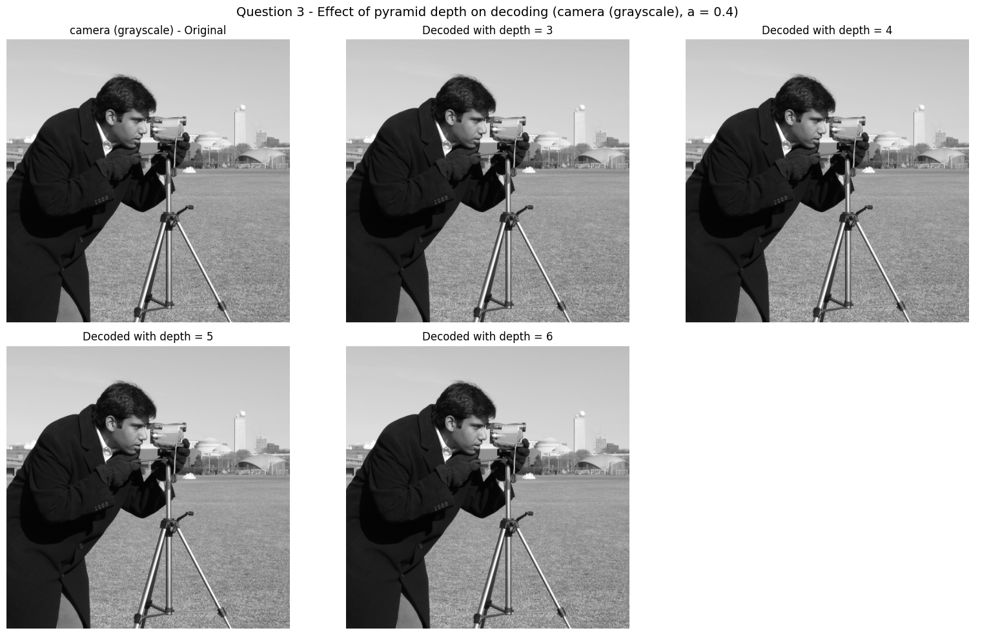


Reconstruction errors for camera (grayscale) (a = 0.4)


,depth,max_abs_error,mse
0,3,1.421085e-14,1.980322e-32
1,4,1.421085e-14,5.432251e-32
2,5,1.421085e-14,1.104829e-31
3,6,1.421085e-14,1.423067e-31


In [ ]:
# ============================================================
# Part B.2 - Question 3
# Display the original and decoded images for different values
# of depth in the interval [3, ..., 6]
# ============================================================

import pandas as pd
import matplotlib.pyplot as plt
from skimage import data


# ------------------------------------------------------------
# Ensure the test images exist
# ------------------------------------------------------------
try:
    lena_rgb
except NameError:
    lena_rgb = load_lena_rgb()

try:
    camera_gray
except NameError:
    camera_gray = data.camera().astype(np.float64)


# ------------------------------------------------------------
# Fixed a for this experiment
# We vary only 'depth' here.
# ------------------------------------------------------------
a_fixed = 0.4
depth_values = [3, 4, 5, 6]


def run_depth_experiment(image, image_name, a, depth_values, cmap=None):
    """
    For a fixed a, reconstruct the image for several pyramid depths,
    display the results, and report reconstruction errors.
    """
    reconstructions = []
    rows = []

    for depth in depth_values:
        max_depth = _max_pyramid_depth(image.shape)

        if depth > max_depth:
            print(f"Skipping depth = {depth} for {image_name} (max valid depth = {max_depth})")
            continue

        L = LPyramid(image, a=a, depth=depth)
        reconstructed = L_Pyramid_Decode(L, a=a)

        max_abs_err, mse = reconstruction_error(image, reconstructed)

        reconstructions.append((depth, reconstructed))
        rows.append({
            "depth": depth,
            "max_abs_error": max_abs_err,
            "mse": mse
        })

    # --------------------------------------------------------
    # Visualization
    # Layout: 2 rows x 3 columns
    # [Original, depth=3, depth=4]
    # [depth=5, depth=6, empty]
    # --------------------------------------------------------
    fig, axes = plt.subplots(2, 3, figsize=(16, 10))
    axes = axes.ravel()

    if image.ndim == 2:
        axes[0].imshow(clip_to_uint8(image), cmap=cmap)
    else:
        axes[0].imshow(clip_to_uint8(image))
    axes[0].set_title(f"{image_name} - Original")
    axes[0].axis("off")

    for idx, (depth, reconstructed) in enumerate(reconstructions, start=1):
        if reconstructed.ndim == 2:
            axes[idx].imshow(clip_to_uint8(reconstructed), cmap=cmap)
        else:
            axes[idx].imshow(clip_to_uint8(reconstructed))

        axes[idx].set_title(f"Decoded with depth = {depth}")
        axes[idx].axis("off")

    # Hide any unused subplot(s)
    for idx in range(1 + len(reconstructions), len(axes)):
        axes[idx].axis("off")

    plt.suptitle(
        f"Question 3 - Effect of pyramid depth on decoding ({image_name}, a = {a})",
        fontsize=14
    )
    plt.tight_layout()
    plt.show()

    # --------------------------------------------------------
    # Error table
    # --------------------------------------------------------
    df = pd.DataFrame(rows)
    print(f"\nReconstruction errors for {image_name} (a = {a})")
    display(df)


# ------------------------------------------------------------
# Run the experiment for both required images
# ------------------------------------------------------------
run_depth_experiment(
    image=lena_rgb,
    image_name="Lena (RGB)",
    a=a_fixed,
    depth_values=depth_values
)

run_depth_experiment(
    image=camera_gray,
    image_name="camera (grayscale)",
    a=a_fixed,
    depth_values=depth_values,
    cmap="gray"
)

### **Results and Comments - Question 4**

This experiment is the first one in which the effect of the Laplacian Pyramid becomes meaningful from a **coding** point of view. In the previous questions, changing $a$ or the pyramid depth did not visibly affect reconstruction, because the pyramid was decoded without quantization and therefore the representation remained essentially lossless. Here, instead, we study the **entropy** of the representation, which is directly related to how efficiently the pyramid could be encoded.

In the paper, the main idea is that the Laplacian Pyramid does not simply store blurred copies of the image. It stores **prediction errors** between adjacent Gaussian levels. These error images are much less correlated than the original image and their coefficients tend to be concentrated near zero. This is exactly why the method is useful for compression: after decorrelation, the histogram becomes more peaked around zero, the variance decreases, and the entropy is reduced. At the same time, each higher pyramid level is sampled more sparsely, so even when some coarse levels have relatively high entropy per coefficient, their total contribution to the final bit rate remains limited.

---

#### 1. What the plots show at a high level

The diagrams summarize the estimated rate of the **whole pyramid** for all tested combinations of:

$$
a \in \{0.3,0.4,0.5,0.6,0.7\}, \qquad \text{depth} \in \{3,4,5,6\}
$$

The most important observation is that the entropy is **not random** with respect to $a$. It follows a clear trend: it decreases as $a$ moves from smaller values toward an intermediate range, reaches a minimum around $a \approx 0.6$, and then increases again for larger values such as $a = 0.7$. This means that the parameter $a$ strongly affects how well the pyramid decorrelates the image.

The second important observation is that increasing the pyramid depth produces a **much smaller change** than changing $a$. Depth still matters, but its effect is more subtle. In both images, moving from very shallow decompositions to moderately deeper ones improves the coding efficiency, but beyond a certain point the gain becomes small. This indicates that once the main low-frequency structure of the image has already been separated into a few coarse levels, adding extra levels mostly redistributes information rather than dramatically reducing the total rate.

---

#### 2. Interpretation using the theory of the paper

This behavior is fully consistent with Burt and Adelson's analysis. In the paper, the generating kernel is controlled by the parameter $a$, and the shape of the equivalent weighting function changes with it:

- for $a = 0.4$, the weighting function is more **Gaussian-like**,
- for $a = 0.5$, it becomes more **triangular**,
- for $a = 0.3$, it is broader and flatter,
- for $a = 0.6$, it becomes sharper and is accompanied by small negative side lobes.

These differences matter because the Laplacian Pyramid is built from **differences between Gaussian levels**. Therefore, changing the Gaussian kernel changes the quality of the prediction from one level to the next, and that changes the distribution of the residual coefficients. A better prediction produces a residual image that is more concentrated around zero and thus has lower entropy. This is exactly what the paper reports: the authors observe that the strongest entropy reduction in their examples is obtained near $a = 0.6$. Our results follow the same general pattern, which is an important validation of both the implementation and the experimental procedure.

In other words, Question 4 is where the role of $a$ becomes clear. In Questions 2 and 3, all values of $a$ reconstructed well. Here, however, we see that not all values of $a$ are equally good from a **compression** perspective.

---

#### 3. Why the best values appear near $a = 0.6$

A key conclusion from the paper is that the most useful representation is not necessarily the one that looks most “Gaussian” in the smoothing step, but the one that yields the most compact **difference images**. The values around $a = 0.6$ tend to produce better prediction errors, meaning that the expanded coarse image is a more effective predictor of the finer one. As a result, the Laplacian coefficients are more tightly clustered around zero, which reduces entropy.

This explains why the entropy curves have a minimum near $a = 0.6$ rather than near $a = 0.4$. The parameter $a = 0.4$ is attractive because it produces a very Gaussian-like equivalent kernel, but that does not automatically mean it is optimal for coding. The paper explicitly notes that $a = 0.6$ gave the greatest reduction in their experiments and also produced visually “crisper” Gaussian pyramid levels. Our results are therefore in strong agreement with the main message of the paper.

The rise in entropy again at $a = 0.7$ is also reasonable. At that point, the kernel shape has moved away from the most effective decorrelating regime, so the residual representation becomes less compact.

---

#### 4. Effect of depth and why the improvement saturates

The depth experiments show that going deeper generally helps up to a point, but the improvement is not dramatic after the first few levels. This also follows naturally from the pyramid structure.

Each time we go one level higher:
- the image becomes lower-pass,
- the number of samples is reduced,
- and the corresponding Laplacian band captures progressively coarser information.

This means that deeper pyramids separate the image into more frequency bands, which can help coding because the representation becomes more structured across scales. However, the top levels are very small, so even if they carry important coarse information, they do not dominate the overall rate. As a result, once the main decorrelation benefit has already been achieved, adding more depth produces only marginal additional savings.

This is why the total entropy tends to stabilize for larger depths. The depth parameter mainly changes **how** information is distributed among levels, while the parameter $a$ changes **how compact** those residual coefficients are.

Another important point from the paper is that high pyramid levels often have higher entropy or variance per coefficient, but they are sampled at much lower density. Therefore, their impact on total bits per original pixel is relatively limited. This explains why deeper pyramids do not necessarily increase the global rate even if some coarse levels appear less compact on a per-level basis.

---

#### 5. Comparison between Lena and camera

The two images show the same qualitative behavior, which is encouraging, but they are not identical cases.

The grayscale **camera** image achieves lower rates overall than **Lena**, which is expected. It contains only one channel and also has simpler statistical structure than a color image with strong chromatic variation and fine textured regions. Lena, by contrast, contains three color channels and richer local variability, so the residual representation is less compact overall.

Still, both images indicate that:
- the best coding behavior is achieved for an intermediate value of $a$ close to $0.6$,
- the effect of depth is weaker than the effect of $a$,
- and after a moderate depth, the rate changes only slightly.

The fact that the exact best depth is not identical for the two images is not a contradiction. It simply shows that the optimal operating point is **image dependent**. The paper also treats the choice of parameters as something that can vary with image statistics and with the intended coding strategy.

---

#### 6. Why this question matters for the rest of the assignment

This question connects the implementation directly to the compression objective of the Laplacian Pyramid. The previous experiments confirmed that the algorithm works correctly. This experiment shows **which parameter choices are more useful for compact coding**.

That is crucial for the next stage, because quantization will be applied on top of this entropy-reduced representation. If the chosen pyramid already has residuals concentrated near zero, then quantization and variable-length coding become much more effective. In that sense, Question 4 identifies the parameter region in which the pyramid is best prepared for compression.

So the main high-level conclusion is the following:

- the Laplacian Pyramid successfully decorrelates the image,
- the parameter $a$ has a strong influence on coding efficiency,
- values near $a = 0.6$ are the most favorable, in agreement with the paper,
- pyramid depth has a secondary but still meaningful effect,
- and after a moderate number of levels, the gain from increasing depth becomes small.

This is exactly the type of behavior we would expect from the theory of the paper, so the experimental results support both the implementation and the underlying image-coding interpretation.

Question 4 - Entropy analysis for Lena (RGB)


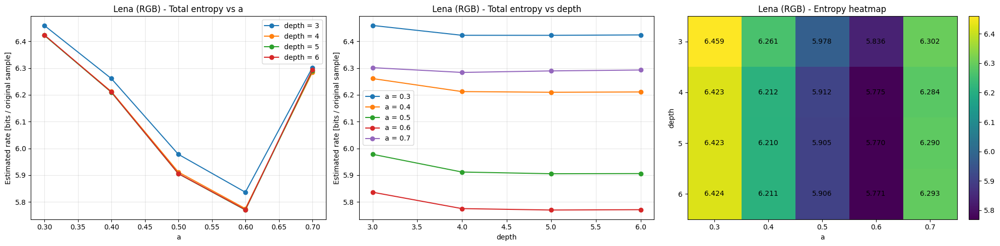


Entropy results for all (a, depth) combinations - Lena (RGB)


,a,depth,total_bits,total_bpp,H_level_0,H_level_1,H_level_2,H_level_3,H_level_4,H_level_5
0,0.3,3,5.079836e+06,6.459345,4.826836,4.615291,7.658979,NaN,NaN,NaN
1,0.4,3,4.923789e+06,6.260921,4.663704,4.471408,7.669839,NaN,NaN,NaN
2,0.5,3,4.701248e+06,5.977946,4.428460,4.276387,7.686227,NaN,NaN,NaN
3,0.6,3,4.589803e+06,5.836236,4.269497,4.338825,7.712530,NaN,NaN,NaN
4,0.7,3,4.955799e+06,6.301624,4.576806,4.960905,7.753465,NaN,NaN,NaN
5,0.3,4,5.050963e+06,6.422632,4.826836,4.615291,5.173865,7.590799,NaN,NaN
6,0.4,4,4.885552e+06,6.212301,4.663704,4.471408,4.989562,7.609403,NaN,NaN
7,0.5,4,4.649168e+06,5.911723,4.428460,4.276387,4.718324,7.633360,NaN,NaN
8,0.6,4,4.541664e+06,5.775024,4.269497,4.338825,4.814875,7.673022,NaN,NaN
9,0.7,4,4.941859e+06,6.283899,4.576806,4.960905,5.533287,7.746318,NaN,NaN


Best combination for Lena (RGB): a = 0.6, depth = 5, total_bpp = 5.769710
Question 4 - Entropy analysis for camera (grayscale)


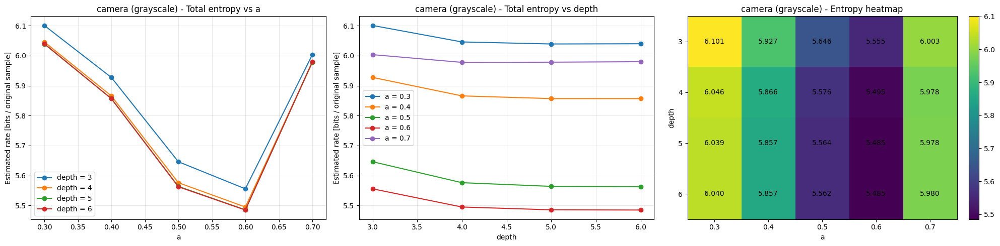


Entropy results for all (a, depth) combinations - camera (grayscale)


,a,depth,total_bits,total_bpp,H_level_0,H_level_1,H_level_2,H_level_3,H_level_4,H_level_5
0,0.3,3,1.599281e+06,6.100772,4.618611,4.181179,6.989849,NaN,NaN,NaN
1,0.4,3,1.553803e+06,5.927290,4.462282,4.110195,6.999348,NaN,NaN,NaN
2,0.5,3,1.480060e+06,5.645981,4.210297,3.989884,7.011415,NaN,NaN,NaN
3,0.6,3,1.456330e+06,5.555459,4.086450,4.112751,7.053137,NaN,NaN,NaN
4,0.7,3,1.573736e+06,6.003325,4.381485,4.700597,7.147050,NaN,NaN,NaN
5,0.3,4,1.584869e+06,6.045795,4.618611,4.181179,4.371243,6.955919,NaN,NaN
6,0.4,4,1.537650e+06,5.865667,4.462282,4.110195,4.276066,6.949312,NaN,NaN
7,0.5,4,1.461705e+06,5.575964,4.210297,3.989884,4.155158,6.943905,NaN,NaN
8,0.6,4,1.440426e+06,5.494788,4.086450,4.112751,4.335888,6.986053,NaN,NaN
9,0.7,4,1.566983e+06,5.977566,4.381485,4.700597,4.962250,7.090619,NaN,NaN


Best combination for camera (grayscale): a = 0.6, depth = 6, total_bpp = 5.484721


In [ ]:
# ============================================================
# Part B.2 - Question 4
# Compute entropy and present diagrams for ALL combinations
# of a and depth, for each image
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage import data


# ------------------------------------------------------------
# Ensure the test images exist
# ------------------------------------------------------------
try:
    lena_rgb
except NameError:
    lena_rgb = load_lena_rgb()

try:
    camera_gray
except NameError:
    camera_gray = data.camera().astype(np.float64)


# ------------------------------------------------------------
# Parameters for the experiment
# ------------------------------------------------------------
a_values = [0.3, 0.4, 0.5, 0.6, 0.7]
depth_values = [3, 4, 5, 6]


# ------------------------------------------------------------
# Entropy utilities
# ------------------------------------------------------------
def shannon_entropy_from_values(values):
    """
    Compute Shannon entropy H = -sum(p * log2(p)) from a 1D array.

    Since Laplacian coefficients are floating-point values, we round them
    to the nearest integer before building the histogram, so that entropy
    is computed on a discrete distribution.
    """
    values = np.asarray(values, dtype=np.float64)
    values = np.rint(values).astype(np.int32).ravel()

    _, counts = np.unique(values, return_counts=True)
    probs = counts.astype(np.float64) / counts.sum()

    return -np.sum(probs * np.log2(probs))


def pyramid_total_bits_and_bpp(L, original_shape):
    """
    Estimate the coding cost of the full pyramid:
        total_bits = sum(H_l * N_l)

    where:
        H_l = entropy of level l       [bits / coefficient]
        N_l = number of coefficients at that level

    We also compute:
        total_bpp = total_bits / number_of_original_scalar_samples
    """
    level_entropies = []
    level_sizes = []

    for level in L:
        H_level = shannon_entropy_from_values(level)
        N_level = np.asarray(level).size

        level_entropies.append(H_level)
        level_sizes.append(N_level)

    total_bits = sum(H * N for H, N in zip(level_entropies, level_sizes))
    original_samples = np.prod(original_shape)
    total_bpp = total_bits / original_samples

    return total_bits, total_bpp, level_entropies, level_sizes


# ------------------------------------------------------------
# Main experiment: all (a, depth) combinations
# ------------------------------------------------------------
def entropy_all_combinations(image, image_name, a_values, depth_values):
    rows = []

    max_depth = _max_pyramid_depth(image.shape)

    for depth in depth_values:
        if depth > max_depth:
            continue

        for a in a_values:
            L = LPyramid(image, a=a, depth=depth)
            total_bits, total_bpp, level_entropies, level_sizes = pyramid_total_bits_and_bpp(L, image.shape)

            row = {
                "a": a,
                "depth": depth,
                "total_bits": total_bits,
                "total_bpp": total_bpp
            }

            for i, H_level in enumerate(level_entropies):
                row[f"H_level_{i}"] = H_level

            rows.append(row)

    df = pd.DataFrame(rows)
    df = df.sort_values(["depth", "a"]).reset_index(drop=True)

    # --------------------------------------------------------
    # Pivot table for heatmap-style visualization
    # --------------------------------------------------------
    pivot_bpp = df.pivot(index="depth", columns="a", values="total_bpp")

    # --------------------------------------------------------
    # Figure with 3 plots:
    # 1) total_bpp vs a (one curve per depth)
    # 2) total_bpp vs depth (one curve per a)
    # 3) heatmap of total_bpp for all combinations
    # --------------------------------------------------------
    fig, axes = plt.subplots(1, 3, figsize=(20, 5))

    # Plot 1: total_bpp vs a, grouped by depth
    for depth in depth_values:
        sub = df[df["depth"] == depth]
        if len(sub) > 0:
            axes[0].plot(sub["a"], sub["total_bpp"], marker="o", label=f"depth = {depth}")

    axes[0].set_title(f"{image_name} - Total entropy vs a")
    axes[0].set_xlabel("a")
    axes[0].set_ylabel("Estimated rate [bits / original sample]")
    axes[0].grid(True, alpha=0.3)
    axes[0].legend()

    # Plot 2: total_bpp vs depth, grouped by a
    for a in a_values:
        sub = df[df["a"] == a]
        if len(sub) > 0:
            axes[1].plot(sub["depth"], sub["total_bpp"], marker="o", label=f"a = {a}")

    axes[1].set_title(f"{image_name} - Total entropy vs depth")
    axes[1].set_xlabel("depth")
    axes[1].set_ylabel("Estimated rate [bits / original sample]")
    axes[1].grid(True, alpha=0.3)
    axes[1].legend()

    # Plot 3: heatmap of all combinations
    im = axes[2].imshow(pivot_bpp.values, aspect="auto")

    axes[2].set_title(f"{image_name} - Entropy heatmap")
    axes[2].set_xlabel("a")
    axes[2].set_ylabel("depth")
    axes[2].set_xticks(np.arange(len(pivot_bpp.columns)))
    axes[2].set_xticklabels([str(a) for a in pivot_bpp.columns])
    axes[2].set_yticks(np.arange(len(pivot_bpp.index)))
    axes[2].set_yticklabels([str(d) for d in pivot_bpp.index])

    # write values inside heatmap
    for i in range(pivot_bpp.shape[0]):
        for j in range(pivot_bpp.shape[1]):
            axes[2].text(
                j, i,
                f"{pivot_bpp.values[i, j]:.3f}",
                ha="center",
                va="center"
            )

    fig.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

    print(f"\nEntropy results for all (a, depth) combinations - {image_name}")
    display(df)

    # best combination
    best_row = df.loc[df["total_bpp"].idxmin()]
    print(
        f"Best combination for {image_name}: "
        f"a = {best_row['a']}, depth = {int(best_row['depth'])}, "
        f"total_bpp = {best_row['total_bpp']:.6f}"
    )

    return df, pivot_bpp


# ------------------------------------------------------------
# Run Question 4 for both images
# ------------------------------------------------------------
images_q4 = {
    "Lena (RGB)": lena_rgb,
    "camera (grayscale)": camera_gray
}

q4_results = {}

for image_name, image in images_q4.items():
    print("=" * 100)
    print(f"Question 4 - Entropy analysis for {image_name}")

    df_result, pivot_result = entropy_all_combinations(
        image=image,
        image_name=image_name,
        a_values=a_values,
        depth_values=depth_values
    )

    q4_results[image_name] = {
        "table": df_result,
        "heatmap_table": pivot_result
    }

### **Results and Comments - Question 5**

In this experiment, the goal was to determine, for each pyramid level separately, which value of $(a)$ gives the **minimum entropy**. Unlike Question 4, where we evaluated the coding efficiency of the **whole pyramid**, here we examine the behavior of each level individually.

This distinction is important. The Laplacian Pyramid is a **multiscale representation**, and each level corresponds to a different spatial-frequency band:
- the lower levels $(L_0, L_1, \dots)$ contain finer detail,
- the higher levels contain progressively coarser information,
- and the last stored level is the coarsest Gaussian image.

Therefore, the value of $(a)$ that is best for one level does not have to be best for another level.

---

#### 1. Main observation

The results show that the optimal value of $(a)$ is **not identical across all levels**.

For both **Lena** and **camera**, the pattern is very clear:

- the finest Laplacian level $(L_0)$ is optimized by a value close to **\(a = 0.6\)**,
- the middle Laplacian levels are mostly optimized by **\(a = 0.5\)**,
- the final coarsest Gaussian level may prefer a different value again.

So, while Question 4 suggested that the **best overall coding performance** is achieved near \(a = 0.6\), Question 5 shows that this is actually the result of a **global tradeoff across levels**, not because every level individually prefers the same parameter.

---

#### 2. Why this happens

This behavior follows naturally from the theory of the paper. The parameter $(a)$ changes the shape of the generating kernel, and therefore changes:

- the smoothing performed before subsampling,
- the prediction generated by the EXPAND step,
- and the statistical distribution of the residual coefficients at each scale.

Since each level corresponds to a different scale, the “best” prediction filter is not necessarily the same for all of them.

At fine scales, the representation is more sensitive to edges, textures, and high-frequency detail.  
At coarser scales, the pyramid captures broader intensity transitions and large image structures.  
Because these scales have different statistics, the entropy-minimizing value of $(a)$ can also differ.

This is exactly the kind of multiscale behavior one would expect in a transform-based coding method: the representation is not uniform across levels, so parameter optimality is not uniform either.

---

#### 3. Interpretation of the level-wise trends

A strong and consistent result is that the first Laplacian level $(L_0)$ is best near \(a = 0.6\) for both images. This agrees with the paper’s general conclusion that values around \(a = 0.6\) often produce a more effective decorrelation of the image, especially in the finer residual bands.

For the intermediate Laplacian levels, the minimum entropy is generally achieved at \(a = 0.5\). This suggests that, at those scales, the slightly different smoothing/interpolation balance of \(a = 0.5\) produces more compact residual histograms than \(a = 0.6\).

The coarsest stored Gaussian level behaves differently again. This is reasonable, because it is not a difference image like the other levels. It is a heavily reduced low-pass representation of the image, and its statistics are therefore fundamentally different from the Laplacian residuals.

So, Question 5 reveals an important structural fact:

$
\text{The entropy-optimal } a \text{ depends on scale.}
$

---

#### 4. Relation to Question 4

This experiment helps explain the outcome of Question 4.

In Question 4, the total entropy of the whole pyramid was minimized by a single global value of $(a)$, close to \(0.6\). But that total entropy is a **weighted sum over all levels**, where each level contributes according to both:
- its entropy per coefficient,
- and its number of coefficients.

The lower levels contain far more samples than the higher ones, so their behavior dominates the overall bit rate. That is why a value such as \(a = 0.6\), which is especially good for the finest level $(L_0)$, can become optimal for the full pyramid even if some intermediate levels are slightly better at \(a = 0.5\).

In other words, the globally optimal $(a)$ is not simply the most frequent level-wise winner. It is the value that gives the best total balance once the relative size of the levels is taken into account.

---

#### 5. Coding interpretation

From a compression viewpoint, these results are very meaningful. They show that the Laplacian Pyramid is not just a fixed transform with identical statistics everywhere. Each level has its own entropy behavior and therefore its own coding preferences.

This suggests two possible perspectives:

- **single-parameter design:** choose one global $(a)$ for the whole pyramid, which is simpler and more practical,
- **level-adaptive design:** in principle, choose a different $(a)$ for each level to optimize entropy locally.

The assignment and the paper focus on the first approach, because it is simpler and easier to implement. Still, Question 5 shows that the second idea has theoretical interest, since different scales do not behave exactly the same.

---

#### 6. Final conclusion

The main conclusion of this experiment is that the entropy-optimal value of $(a)$ is **level dependent**.

This complements the previous question:

- Question 4 identified the best **global** value of $(a)$ for the whole pyramid.
- Question 5 shows that, at the level-wise scale, the optimum varies across the pyramid.

The results are fully consistent with the theory of the Laplacian Pyramid:
- different scales have different statistical structure,
- the parameter $(a)$ changes the prediction quality differently at each scale,
- and therefore the entropy minimum shifts from one level to another.

Overall, the experiment strengthens the main message of the paper: the parameter $(a)$ has a real and nontrivial effect on coding efficiency, and its impact must be understood in a **multiscale** way rather than as a single uniform effect across the whole pyramid.

Question 5 - Optimal a per level for Lena (RGB)


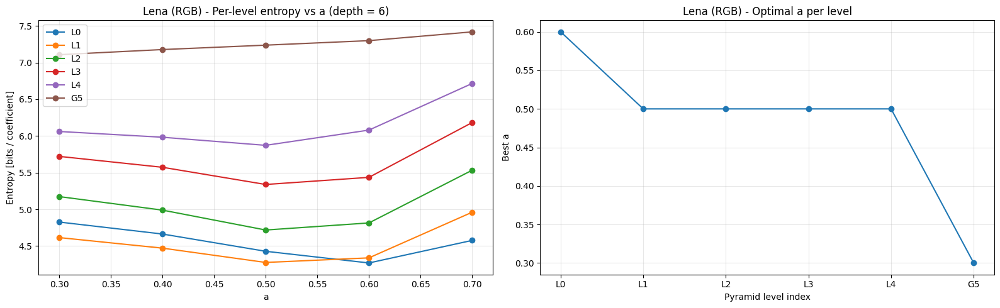


Per-level entropy table for Lena (RGB) (depth = 6)


,a,depth,H_level_0,H_level_1,H_level_2,H_level_3,H_level_4,H_level_5
0,0.3,6,4.826836,4.615291,5.173865,5.721620,6.060952,7.107209
1,0.4,6,4.663704,4.471408,4.989562,5.573250,5.982412,7.177208
2,0.5,6,4.428460,4.276387,4.718324,5.338833,5.872294,7.237251
3,0.6,6,4.269497,4.338825,4.814875,5.435917,6.079821,7.298727
4,0.7,6,4.576806,4.960905,5.533287,6.182832,6.715315,7.418093



Optimal a per level for Lena (RGB)


,level_index,level_label,best_a,min_entropy
0,0,L0,0.6,4.269497
1,1,L1,0.5,4.276387
2,2,L2,0.5,4.718324
3,3,L3,0.5,5.338833
4,4,L4,0.5,5.872294
5,5,G5,0.3,7.107209


Question 5 - Optimal a per level for camera (grayscale)


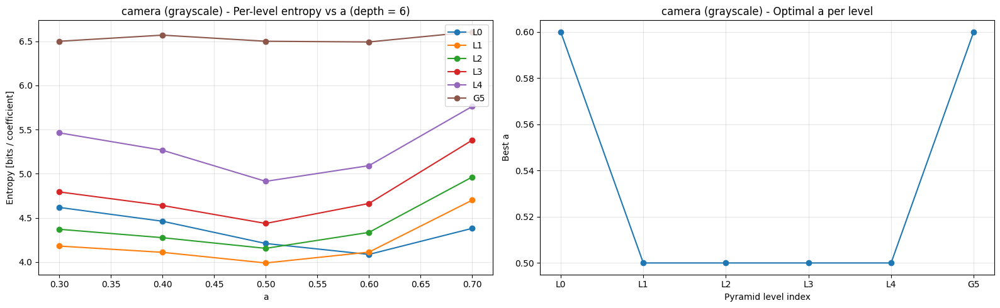


Per-level entropy table for camera (grayscale) (depth = 6)


,a,depth,H_level_0,H_level_1,H_level_2,H_level_3,H_level_4,H_level_5
0,0.3,6,4.618611,4.181179,4.371243,4.794048,5.462896,6.499381
1,0.4,6,4.462282,4.110195,4.276066,4.640693,5.266235,6.568722
2,0.5,6,4.210297,3.989884,4.155158,4.437113,4.913797,6.499635
3,0.6,6,4.086450,4.112751,4.335888,4.663202,5.091392,6.491569
4,0.7,6,4.381485,4.700597,4.962250,5.379541,5.761341,6.605643



Optimal a per level for camera (grayscale)


,level_index,level_label,best_a,min_entropy
0,0,L0,0.6,4.086450
1,1,L1,0.5,3.989884
2,2,L2,0.5,4.155158
3,3,L3,0.5,4.437113
4,4,L4,0.5,4.913797
5,5,G5,0.6,6.491569


In [ ]:
# ============================================================
# Part B.2 - Question 5
# Find the optimal a, with respect to entropy, at each level
# of the Laplacian pyramid, for each image
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage import data


# ------------------------------------------------------------
# Ensure the test images exist
# ------------------------------------------------------------
try:
    lena_rgb
except NameError:
    lena_rgb = load_lena_rgb()

try:
    camera_gray
except NameError:
    camera_gray = data.camera().astype(np.float64)


# ------------------------------------------------------------
# Parameters for Question 5
# We use a common fixed depth so that the same level indices
# exist for all tested values of a.
# ------------------------------------------------------------
a_values = [0.3, 0.4, 0.5, 0.6, 0.7]
depth_q5 = 6


# ------------------------------------------------------------
# Entropy helper
# Reuse the same discrete entropy definition as in Question 4.
# ------------------------------------------------------------
def shannon_entropy_from_values(values):
    """
    Compute Shannon entropy from a discrete histogram built from the
    rounded coefficient values.
    """
    values = np.asarray(values, dtype=np.float64)
    values = np.rint(values).astype(np.int32).ravel()

    _, counts = np.unique(values, return_counts=True)
    probs = counts.astype(np.float64) / counts.sum()

    return -np.sum(probs * np.log2(probs))


def pyramid_level_entropies(L):
    """
    Return the entropy of each level of the pyramid.
    """
    return [shannon_entropy_from_values(level) for level in L]


def make_level_labels(num_levels):
    """
    Label Laplacian levels as:
      L0, L1, ..., L_(N-2), G_(N-1)

    where the final stored level is the coarsest Gaussian image.
    """
    labels = [f"L{i}" for i in range(num_levels - 1)]
    labels.append(f"G{num_levels - 1}")
    return labels


# ------------------------------------------------------------
# Main Question 5 analysis
# ------------------------------------------------------------
def find_optimal_a_per_level(image, image_name, a_values, depth):
    """
    For a fixed depth, compute the entropy of each pyramid level
    for each tested value of a, then identify the a that minimizes
    entropy at each level.
    """
    max_depth = _max_pyramid_depth(image.shape)
    if depth > max_depth:
        raise ValueError(
            f"Requested depth={depth}, but maximum valid depth for {image_name} is {max_depth}."
        )

    rows = []

    for a in a_values:
        L = LPyramid(image, a=a, depth=depth)
        entropies = pyramid_level_entropies(L)

        row = {"a": a, "depth": depth}
        for i, H in enumerate(entropies):
            row[f"H_level_{i}"] = H
        rows.append(row)

    df = pd.DataFrame(rows)

    level_cols = [col for col in df.columns if col.startswith("H_level_")]
    num_levels = len(level_cols)
    level_labels = make_level_labels(num_levels)

    # --------------------------------------------------------
    # Best a per level
    # --------------------------------------------------------
    best_rows = []
    for i, col in enumerate(level_cols):
        idx_best = df[col].idxmin()
        best_rows.append({
            "level_index": i,
            "level_label": level_labels[i],
            "best_a": df.loc[idx_best, "a"],
            "min_entropy": df.loc[idx_best, col]
        })

    best_df = pd.DataFrame(best_rows)

    # --------------------------------------------------------
    # Plot 1: entropy of each level as a function of a
    # Plot 2: best a per level
    # --------------------------------------------------------
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))

    for i, col in enumerate(level_cols):
        axes[0].plot(df["a"], df[col], marker="o", label=level_labels[i])

    axes[0].set_title(f"{image_name} - Per-level entropy vs a (depth = {depth})")
    axes[0].set_xlabel("a")
    axes[0].set_ylabel("Entropy [bits / coefficient]")
    axes[0].grid(True, alpha=0.3)
    axes[0].legend()

    axes[1].plot(best_df["level_index"], best_df["best_a"], marker="o")
    axes[1].set_title(f"{image_name} - Optimal a per level")
    axes[1].set_xlabel("Pyramid level index")
    axes[1].set_ylabel("Best a")
    axes[1].set_xticks(best_df["level_index"])
    axes[1].set_xticklabels(best_df["level_label"])
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    print(f"\nPer-level entropy table for {image_name} (depth = {depth})")
    display(df)

    print(f"\nOptimal a per level for {image_name}")
    display(best_df)

    return df, best_df


# ------------------------------------------------------------
# Run Question 5 for both images
# ------------------------------------------------------------
q5_results = {}

images_q5 = {
    "Lena (RGB)": lena_rgb,
    "camera (grayscale)": camera_gray
}

for image_name, image in images_q5.items():
    print("=" * 100)
    print(f"Question 5 - Optimal a per level for {image_name}")

    per_level_df, best_a_df = find_optimal_a_per_level(
        image=image,
        image_name=image_name,
        a_values=a_values,
        depth=depth_q5
    )

    q5_results[image_name] = {
        "per_level_entropy": per_level_df,
        "best_a_per_level": best_a_df
    }

### **Results and Comments - Question 6**

In this final experiment, the Laplacian Pyramid was not only constructed and analyzed, but also **quantized**, which is the key step that turns the representation into a genuinely **lossy image code**. This is the stage where the compression goal of the paper becomes most visible in practice.

The quantization was applied using the best **global** parameter choice found earlier for each image, namely a value of \(a\) that gave the most compact overall representation. Although Question 5 showed that the entropy-optimal \(a\) can vary from one pyramid level to another, the pyramid construction itself is defined using a single kernel parameter \(a\) for the whole pyramid, so Question 6 uses one global \(a\) per image rather than a different \(a\) at each level. Then, for each image, two different bin sizes were tested: a **smaller bin size** for mild quantization and a **larger bin size** for stronger quantization.

---

#### 1. Why quantization is the crucial step

Up to this point, the Laplacian Pyramid behaved essentially as an invertible multiscale transform: the image was decomposed into residual bands and then reconstructed with negligible numerical error. That alone is not yet compression. The actual reduction in coding cost happens when the pyramid coefficients are **coarsely represented** rather than stored exactly.

This is exactly the logic described in the paper. The Laplacian Pyramid first decorrelates the image and concentrates many coefficients around zero. Once this has happened, quantization becomes effective because many nearby values can be mapped to the same representative level. As a result:

- the number of distinct coefficient values decreases,
- the coefficient histograms become more peaked,
- the entropy drops,
- and the estimated number of bits required to encode the pyramid becomes significantly smaller.

So, the compression pipeline is:

$
\text{Image} \rightarrow \text{Laplacian Pyramid} \rightarrow \text{Quantization} \rightarrow \text{Lower entropy / lower rate}
$

---

#### 2. High-level effect of bin size

The results clearly show the expected rate-distortion tradeoff.

With a **smaller bin size**, the decoded image remains visually close to the original. Fine details are still preserved reasonably well, and the distortion is relatively mild. At the same time, the estimated rate already drops noticeably compared with the unquantized pyramid.

With a **larger bin size**, the rate decreases much more strongly, but this comes at a clear visual cost. The decoded images show stronger artifacts, loss of local detail, and more visible low-frequency distortions. The error images confirm that the distortion is no longer limited to tiny local fluctuations; it becomes structured and spatially visible.

This is exactly what should happen in a lossy coding system:
- **smaller bins** preserve more fidelity but compress less,
- **larger bins** compress more but degrade quality more strongly.

---

#### 3. Visual interpretation of the reconstructed images

The visual results are very instructive.

For the milder quantization case, both images remain recognizable and visually acceptable. The main structures, contours, and overall tonal content are preserved. The distortions appear mainly as small texture loss, reduced local precision, and low-amplitude reconstruction noise.

For the stronger quantization case, the degradation becomes much more visible:

- in **Lena**, color distortions, smoothing, and structured artifacts become more pronounced,
- in **camera**, the image shows block-like or band-like low-frequency errors, stronger edge distortion, and visibly reduced local fidelity.

This difference is important. Quantization errors in a pyramid domain do not necessarily look like simple pixelwise noise. Because the representation is multiscale, quantization of coarse levels can generate broad spatial artifacts, while quantization of fine levels mainly affects texture and edges. Therefore, the distortion pattern reflects the scale structure of the pyramid itself.

---

#### 4. What the error images reveal

The absolute-error visualizations are especially helpful because they show **where** the quantization error is concentrated.

The error is not uniform. It tends to be stronger:
- near edges,
- in textured regions,
- and in areas where multiscale prediction is harder.

This is fully consistent with the theory of prediction-error coding. Smooth regions are easier to approximate across scales, so their residual coefficients are smaller and are affected less severely by quantization. High-detail areas and strong transitions generate more significant residuals, so quantization introduces larger local errors there.

In the stronger quantization case, the error also becomes more structured at coarse spatial scales. This happens because quantization of higher pyramid levels affects broad image regions after EXPAND and reconstruction.

---

#### 5. Relation to entropy and coding efficiency

One of the main goals of this experiment is to connect **entropy reduction** with **visual distortion**.

Earlier questions showed that the best choices of \(a\) produced lower-entropy pyramids. Here we see the second half of the coding story: after quantization, the estimated bit rate decreases substantially. This confirms the core argument of the paper:

- the Laplacian Pyramid produces a compact multiscale residual representation,
- quantization makes that representation much more compressible,
- but the gain in coding efficiency is paid for by reconstruction error.

So, Question 6 demonstrates the classic **rate-distortion compromise**:
- lower rate means stronger compression,
- but stronger compression means more loss.

This is the practical endpoint of the whole assignment.

---

#### 6. Comparison between Lena and camera

The two images behave similarly in principle, but not identically.

The grayscale **camera** image is simpler in representation because it has only one channel, while **Lena** is an RGB image and therefore carries more information overall. However, the perceptual effect of quantization is not determined only by the number of channels. It also depends on the image content and on how quantization errors interact with edges, smooth regions, and textures.

In both images, the same general pattern appears:
- mild quantization gives a good visual compromise,
- strong quantization produces a much lower estimated rate but also clearly visible artifacts.

This confirms that the method behaves consistently across both grayscale and color images.

---

#### 7. Connection to the paper

This final experiment reflects the central message of *The Laplacian Pyramid as a Compact Image Code*. The paper does not claim that the pyramid is useful merely because it reconstructs the image. Its real usefulness is that it creates a representation whose coefficients are well suited for **quantization and coding**.

The paper emphasizes that the residual images have:
- reduced correlation,
- lower variance,
- and histograms concentrated near zero.

These are exactly the properties that make scalar quantization and entropy coding effective. Our results confirm this behavior experimentally:

- before quantization, the pyramid is accurate but still relatively costly to encode,
- after quantization, the coding cost drops significantly,
- and the visual degradation increases as quantization becomes coarser.

At the same time, the paper also notes that a more refined coding design would generally quantize the higher pyramid levels more finely than the lower ones. In this notebook, for simplicity and for a clean comparison between quantization strengths, each experiment uses a single common bin size across all pyramid levels. Therefore, the experiment captures the main rate-distortion behavior of the Laplacian Pyramid, even though it does not implement level-dependent quantization.

Thus, the experiment successfully reproduces the essential coding principle of the paper.

---

#### 8. Final conclusion

The last question brings together all the earlier parts of the notebook.

- Questions 1-3 verified that the implementation is correct and reconstructs properly.
- Question 4 identified the best global parameter region for compact coding.
- Question 5 showed that entropy behavior varies across pyramid levels.
- Question 6 finally demonstrated the real compression mechanism: **quantization of the Laplacian coefficients**.

The main conclusion is that the Laplacian Pyramid provides an effective transform for lossy image coding because it offers a good compromise between:
- multiscale representation,
- entropy reduction,
- and controllable reconstruction quality.

A small quantization bin preserves good quality with moderate compression, while a large bin achieves stronger compression at the cost of visible artifacts. This is exactly the expected behavior of a compact image code and confirms, in practice, the theoretical motivation of the paper.

Question 6 - Lena (RGB)
Using a = 0.6, depth = 6
Estimated rate before quantization: 5.770946 bits / original sample


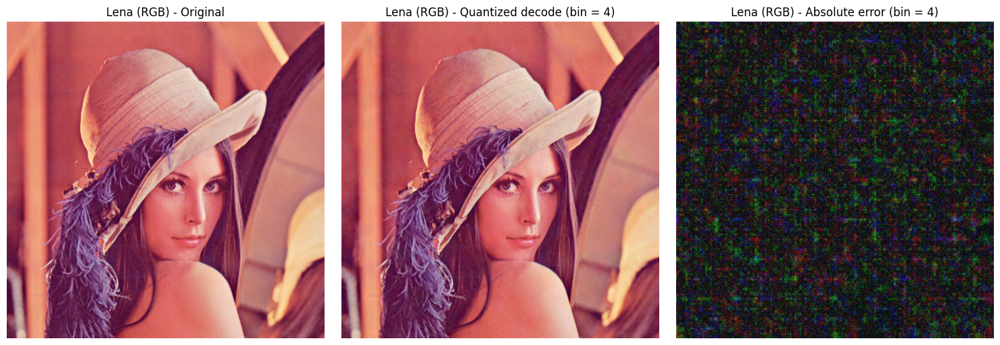

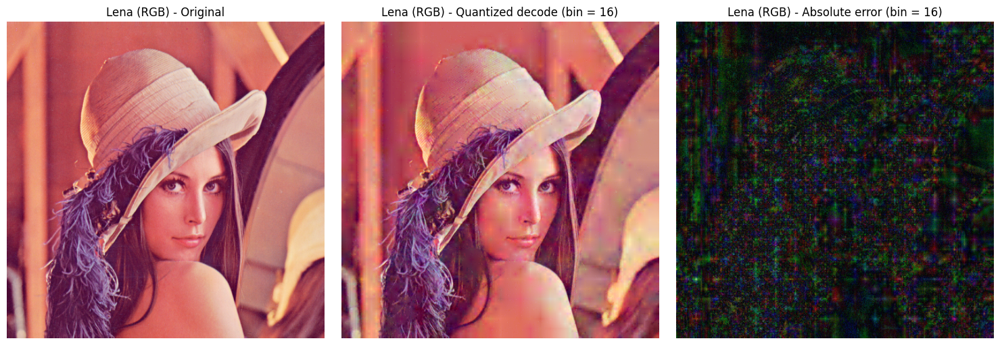


Quantization results for Lena (RGB)


,bin_size,estimated_bpp_before_quant,estimated_bpp_after_quant,mse,psnr_db,max_abs_error
0,4,5.770946,3.178666,7.378555,39.45109,17.765713
1,16,5.770946,0.937192,86.240711,28.77368,70.083167


Question 6 - camera (grayscale)
Using a = 0.6, depth = 6
Estimated rate before quantization: 5.484721 bits / original sample


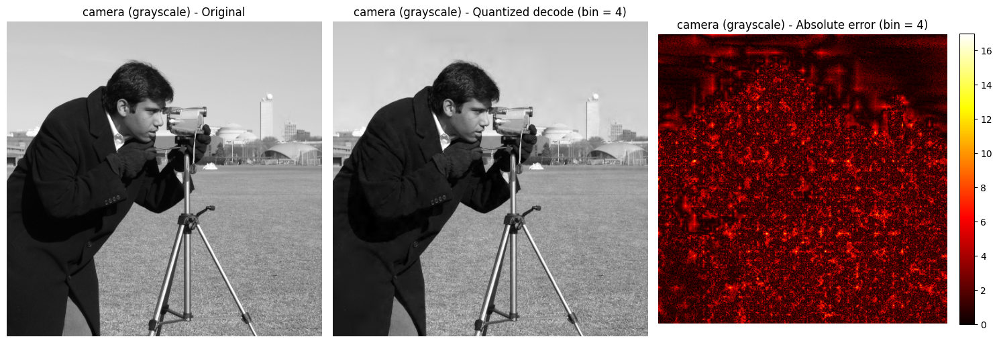

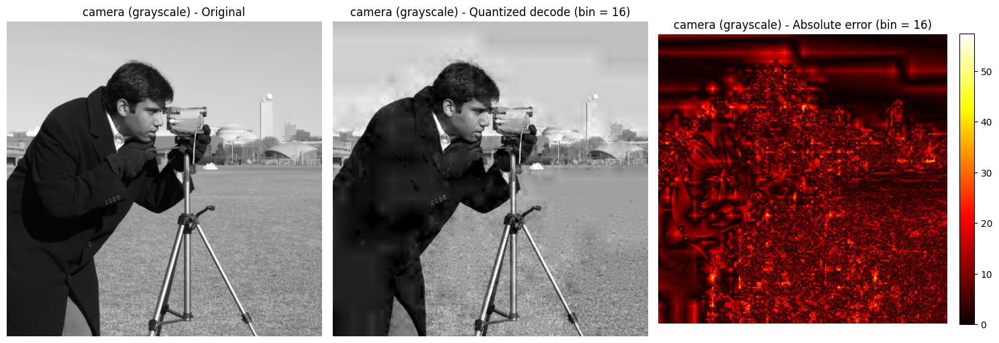


Quantization results for camera (grayscale)


,bin_size,estimated_bpp_before_quant,estimated_bpp_after_quant,mse,psnr_db,max_abs_error
0,4,5.484721,3.122948,5.830617,40.473658,16.989119
1,16,5.484721,1.303582,76.996715,29.266082,57.397877


In [ ]:
# ============================================================
# Part B.2 - Question 6
# Quantize Lena and camera using the best global a and
# two different bin sizes for each image
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage import data


# ------------------------------------------------------------
# Ensure the test images exist
# ------------------------------------------------------------
try:
    lena_rgb
except NameError:
    lena_rgb = load_lena_rgb()

try:
    camera_gray
except NameError:
    camera_gray = data.camera().astype(np.float64)


# ------------------------------------------------------------
# Best global a from Question 4
# Keep depth = 6 for consistency with Question 5
# ------------------------------------------------------------
best_a_per_image = {
    "Lena (RGB)": 0.6,
    "camera (grayscale)": 0.6
}

depth_q6 = 6

# Two required experiments per image
bin_sizes_q6 = [4, 16]


# ------------------------------------------------------------
# Helper functions
# ------------------------------------------------------------
def shannon_entropy_from_values(values):
    """
    Shannon entropy from a discrete histogram of coefficient values.
    Quantized coefficients are already effectively discrete, but we keep
    rounding for numerical robustness.
    """
    values = np.asarray(values, dtype=np.float64)
    values = np.rint(values).astype(np.int32).ravel()

    _, counts = np.unique(values, return_counts=True)
    probs = counts.astype(np.float64) / counts.sum()

    return -np.sum(probs * np.log2(probs))


def pyramid_total_bits_and_bpp(L, original_shape):
    """
    Estimated coding cost of the full pyramid:
        total_bits = sum(H_l * N_l)

    where:
        H_l = entropy of level l [bits / coefficient]
        N_l = number of scalar coefficients at level l

    Also returns:
        total_bpp = total_bits / number_of_original_scalar_samples
    """
    level_entropies = []
    level_sizes = []

    for level in L:
        H_level = shannon_entropy_from_values(level)
        N_level = np.asarray(level).size

        level_entropies.append(H_level)
        level_sizes.append(N_level)

    total_bits = sum(H * N for H, N in zip(level_entropies, level_sizes))
    original_samples = np.prod(original_shape)
    total_bpp = total_bits / original_samples

    return total_bits, total_bpp, level_entropies, level_sizes


def compute_psnr(original, reconstructed, data_range=255.0):
    """
    Peak Signal-to-Noise Ratio in dB.
    """
    original = np.asarray(original, dtype=np.float64)
    reconstructed = np.asarray(reconstructed, dtype=np.float64)

    mse = np.mean((original - reconstructed) ** 2)
    if mse == 0:
        return np.inf

    return 10.0 * np.log10((data_range ** 2) / mse)


def show_quantization_results(original, reconstructed, image_name, bin_size, cmap=None):
    """
    Show original, quantized reconstruction, and absolute error.
    """
    abs_err = np.abs(original - reconstructed)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    if original.ndim == 2:
        axes[0].imshow(clip_to_uint8(original), cmap=cmap)
        axes[1].imshow(clip_to_uint8(reconstructed), cmap=cmap)

        vmax = abs_err.max() if abs_err.max() > 0 else 1.0
        im = axes[2].imshow(abs_err, cmap="hot", vmin=0, vmax=vmax)
        fig.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)
    else:
        axes[0].imshow(clip_to_uint8(original))
        axes[1].imshow(clip_to_uint8(reconstructed))

        if abs_err.max() > 0:
            err_vis = abs_err / abs_err.max()
        else:
            err_vis = abs_err
        axes[2].imshow(err_vis)

    axes[0].set_title(f"{image_name} - Original")
    axes[1].set_title(f"{image_name} - Quantized decode (bin = {bin_size})")
    axes[2].set_title(f"{image_name} - Absolute error (bin = {bin_size})")

    for ax in axes:
        ax.axis("off")

    plt.tight_layout()
    plt.show()


def run_quantization_experiment(image, image_name, a_best, depth, bin_sizes, cmap=None):
    """
    Build the Laplacian pyramid, quantize it with two different bin sizes,
    decode the quantized pyramids, and report quality/rate metrics.
    """
    print("=" * 100)
    print(f"Question 6 - {image_name}")
    print(f"Using a = {a_best}, depth = {depth}")

    # Original unquantized pyramid
    L = LPyramid(image, a=a_best, depth=depth)
    total_bits_orig, total_bpp_orig, _, _ = pyramid_total_bits_and_bpp(L, image.shape)

    print(f"Estimated rate before quantization: {total_bpp_orig:.6f} bits / original sample")

    rows = []

    for bin_size in bin_sizes:
        # Quantize pyramid
        Lq = L_Quantization(L, bin_size=bin_size)

        # Decode quantized pyramid
        reconstructed_q = L_Pyramid_Decode(Lq, a=a_best)

        # Metrics
        max_abs_err, mse = reconstruction_error(image, reconstructed_q)
        psnr = compute_psnr(image, reconstructed_q)
        total_bits_q, total_bpp_q, _, _ = pyramid_total_bits_and_bpp(Lq, image.shape)

        rows.append({
            "bin_size": bin_size,
            "estimated_bpp_before_quant": total_bpp_orig,
            "estimated_bpp_after_quant": total_bpp_q,
            "mse": mse,
            "psnr_db": psnr,
            "max_abs_error": max_abs_err
        })

        show_quantization_results(
            original=image,
            reconstructed=reconstructed_q,
            image_name=image_name,
            bin_size=bin_size,
            cmap=cmap
        )

    df = pd.DataFrame(rows)
    print(f"\nQuantization results for {image_name}")
    display(df)

    return df


# ------------------------------------------------------------
# Run the two required experiments for each image
# ------------------------------------------------------------
q6_results = {}

q6_results["Lena (RGB)"] = run_quantization_experiment(
    image=lena_rgb,
    image_name="Lena (RGB)",
    a_best=best_a_per_image["Lena (RGB)"],
    depth=depth_q6,
    bin_sizes=bin_sizes_q6
)

q6_results["camera (grayscale)"] = run_quantization_experiment(
    image=camera_gray,
    image_name="camera (grayscale)",
    a_best=best_a_per_image["camera (grayscale)"],
    depth=depth_q6,
    bin_sizes=bin_sizes_q6,
    cmap="gray"
)

## **Disclaimer**
---

All work submitted in this assignment is **entirely my own**. I independently designed the models, selected parameters, and made all implementation and evaluation decisions.

**AI-based tools were used solely for support purposes**, including:
- **Formatting and organizing** markdown cells for improved clarity,
- **Troubleshooting specific coding issues**,
- **Writing code snippets** based on my own logic and instructions, and
- **Translating content from Greek to English** for documentation and clarity.

At no point was AI used to generate or influence the **core logic**, design choices, or solutions required for the assignment.
